In [28]:
from pyAudioAnalysis import audioSegmentation 
from pyAudioAnalysis import audioBasicIO as aIO
from pyAudioAnalysis import audioSegmentation as aS
import numpy as np
import scipy.io.wavfile as wavfile
import IPython

C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\base.py:329: UserWarning: Trying to unpickle estimator SVC from version 0.24.2 when using version 1.0.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/modules/model_persistence.html#security-maintainability-limitations
  warnings.warn(


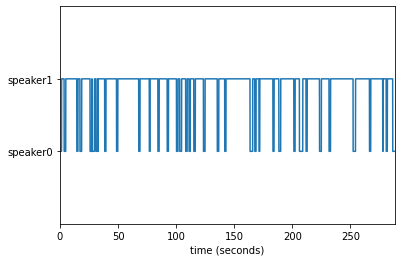

In [18]:
from pyAudioAnalysis import audioSegmentation
num_speakers = 2
a, b, c = audioSegmentation.speaker_diarization("C://Users//User//Desktop//diploma//testcall.wav", num_speakers, plot_res=True)



In [29]:
input_file = "C://Users//User//Desktop//diploma//testcall.wav"
fs, x = read_audio_file(input_file)
x_clusters = [np.zeros((fs, )) for i in range(n_clusters)]
mt_step = 0.1
n_clusters = 4
segs, c = labels_to_segments(a, mt_step)  # convert flags to segment limits


for sp in range(n_clusters):                
    count_cl = 0
    for i in range(len(c)):     # for each segment in each cluster (>2 secs long)
        if c[i] == sp and segs[i, 1]-segs[i, 0] > 2:
            count_cl += 1
            # get the signal and append it to the cluster's signal (followed by some silence)
            cur_x = x[int(segs[i, 0] * fs): int(segs[i, 1] * fs)]
            x_clusters[sp] = np.append(x_clusters[sp], cur_x)
            x_clusters[sp] = np.append(x_clusters[sp], np.zeros((fs,)))
    # write cluster's signal into a WAV file
    print(f'speaker {sp}: {count_cl} segments {len(x_clusters[sp])/float(fs)} sec total dur')        
    wavfile.write(f'diarization_cluster_{sp}.wav', fs, np.int16(x_clusters[sp]))
    IPython.display.display(IPython.display.Audio(f'diarization_cluster_{sp}.wav'))

speaker 0: 4 segments 23.8 sec total dur


speaker 1: 29 segments 493.4 sec total dur


speaker 2: 0 segments 1.0 sec total dur


speaker 3: 0 segments 1.0 sec total dur


In [9]:
print(a)

(array([0, 0, 0, ..., 0, 0, 0], dtype=int64), -1, -1)


In [14]:
from pyAudioAnalysis import audioSegmentation as aS
[flagsInd, classesAll, acc, CM] = aS.mid_term_file_classification("C://Users//User//Desktop//diploma//testcall.wav", "data/models/svm_rbf_sm", "svm", True, 'data/scottish.segments')


mtFileClassificationError: input model_type not found!


In [15]:
import os, sklearn.cluster
from pyAudioAnalysis.MidTermFeatures import mid_feature_extraction as mT
from pyAudioAnalysis.audioBasicIO import read_audio_file, stereo_to_mono
from pyAudioAnalysis.audioSegmentation import labels_to_segments
from pyAudioAnalysis.audioTrainTest import normalize_features
import numpy as np
import scipy.io.wavfile as wavfile
import IPython
# read signal and get normalized segment feature statistics:
input_file = "C://Users//User//Desktop//diploma//testcall.wav"
fs, x = read_audio_file(input_file)
mt_size, mt_step, st_win = 2, 0.1, 0.05
[mt_feats, st_feats, _] = mT(x, fs, mt_size * fs, mt_step * fs,
                            round(fs * st_win), round(fs * st_win * 0.5))
(mt_feats_norm, MEAN, STD) = normalize_features([mt_feats.T])
mt_feats_norm = mt_feats_norm[0].T
# perform clustering
n_clusters = 4
x_clusters = [np.zeros((fs, )) for i in range(n_clusters)]
k_means = sklearn.cluster.KMeans(n_clusters=n_clusters)
k_means.fit(mt_feats_norm.T)
cls = k_means.labels_
# save clusters to concatenated wav files
segs, c = labels_to_segments(cls, mt_step)  # convert flags to segment limits
for sp in range(n_clusters):                
    count_cl = 0
    for i in range(len(c)):     # for each segment in each cluster (>2 secs long)
        if c[i] == sp and segs[i, 1]-segs[i, 0] > 2:
            count_cl += 1
            # get the signal and append it to the cluster's signal (followed by some silence)
            cur_x = x[int(segs[i, 0] * fs): int(segs[i, 1] * fs)]
            x_clusters[sp] = np.append(x_clusters[sp], cur_x)
            x_clusters[sp] = np.append(x_clusters[sp], np.zeros((fs,)))
    # write cluster's signal into a WAV file
    print(f'speaker {sp}: {count_cl} segments {len(x_clusters[sp])/float(fs)} sec total dur')        
    wavfile.write(f'diarization_cluster_{sp}.wav', fs, np.int16(x_clusters[sp]))
    IPython.display.display(IPython.display.Audio(f'diarization_cluster_{sp}.wav'))

ImportError: cannot import name 'normalize_features' from 'pyAudioAnalysis.audioTrainTest' (C:\Users\User\AppData\Local\Programs\Python\Python39\lib\site-packages\pyAudioAnalysis\audioTrainTest.py)